In [ ]:
!pip install --upgrade umap-learn

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
from pathlib import Path
from PIL import Image, UnidentifiedImageError
from tqdm import tqdm  # Thư viện tạo thanh tiến trình (progress bar)
import warnings
import os

# Tắt các cảnh báo từ Pillow khi đọc file ảnh lớn hoặc có vấn đề
warnings.filterwarnings("ignore", "(Possibly corrupt EXIF data|Image size.*exceeds limit)")

def analyze_image_dataset(directory_path):
    """
    Quét đệ quy một thư mục, trích xuất đặc điểm của từng ảnh
    và trả về một DataFrame Pandas chứa kết quả phân tích.
    """
    img_dir = Path(directory_path)

    if not img_dir.is_dir():
        print(f"Lỗi: '{directory_path}' không phải là một thư mục hợp lệ.")
        return

    # Các đuôi file ảnh phổ biến
    valid_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff'}

    image_data = []
    failed_files = []

    print(f"Đang lập chỉ mục các file ảnh tại: {img_dir}...")

    # Bước 1: Thu thập tất cả các file ảnh (để tqdm biết tổng số)
    all_files = [f for f in img_dir.rglob('*')
                 if f.is_file() and f.suffix.lower() in valid_extensions]

    if not all_files:
        print("Không tìm thấy file ảnh hợp lệ nào trong thư mục.")
        return

    print(f"Tìm thấy {len(all_files)} file ảnh. Bắt đầu trích xuất đặc điểm...")

    # Bước 2: Xử lý từng file với thanh tiến trình
    for file_path in tqdm(all_files, desc="Đang xử lý ảnh"):
        try:
            # Lấy dung lượng file
            file_size_kb = os.path.getsize(file_path) / 1024  # Tính bằng Kilobytes

            # Mở ảnh để lấy thông tin meta
            with Image.open(file_path) as img:
                width, height = img.size
                mode = img.mode  # Ví dụ: 'RGB', 'L' (ảnh xám), 'RGBA' (có kênh alpha)

                # Tính toán các đặc điểm
                aspect_ratio = width / height if height > 0 else 0

                # Thêm dữ liệu vào danh sách
                image_data.append({
                    "filename": file_path.name,
                    "path": str(file_path),
                    "width": width,
                    "height": height,
                    "dimensions": f"{width}x{height}",
                    "aspect_ratio": round(aspect_ratio, 2),
                    "mode": mode,
                    "format": file_path.suffix.lower(),
                    "file_size_kb": round(file_size_kb, 2)
                })

        except UnidentifiedImageError:
            # File có đuôi ảnh nhưng không phải ảnh
            failed_files.append((file_path.name, "Không thể nhận dạng"))
        except Exception as e:
            # Các lỗi khác (ví dụ: file bị hỏng)
            failed_files.append((file_path.name, str(e)))

    # Bước 3: Tạo DataFrame từ dữ liệu đã thu thập
    if not image_data:
        print("Không thể xử lý bất kỳ file ảnh nào.")
        return

    df = pd.DataFrame(image_data)

    # Bước 4: In báo cáo phân tích
    print("\n" + "="*40)
    print("  BÁO CÁO PHÂN TÍCH TẬP DỮ LIỆU ẢNH ")
    print("="*40)

    print(f"\n Đã xử lý thành công: {len(df)} ảnh")
    print(f" Xảy ra lỗi: {len(failed_files)} file")
    if failed_files:
        print(f"  (Ví dụ file lỗi đầu tiên: {failed_files[0][0]} - Lý do: {failed_files[0][1]})")

    print("\n--- 1. Tóm tắt các đặc điểm (Số liệu) ---")
    # .describe() cho ta min, max, mean (trung bình), std (độ lệch chuẩn), ...
    print(df[['width', 'height', 'aspect_ratio', 'file_size_kb']].describe().to_string())

    print("\n--- 2. Phân tích Chế độ màu (Mode) ---")
    print(df['mode'].value_counts().to_string())

    print("\n--- 3. Phân tích Định dạng (Format) ---")
    print(df['format'].value_counts().to_string())

    print("\n--- 4. 10 Kích thước (Dimensions) Phổ biến nhất ---")
    print(df['dimensions'].value_counts().head(10).to_string())

    print("\n--- 5. 5 Tỷ lệ khung hình (Aspect Ratio) Phổ biến nhất ---")
    print(df['aspect_ratio'].value_counts().head(5).to_string())

    print("\n" + "="*40)
    print("Phân tích hoàn tất.")

    return df

# --- CHẠY CHƯƠNG TRÌNH ---
if __name__ == "__main__":
    path_input = "/content/drive/MyDrive/KHMT_3_MEMBERS/12526/12526_CT31201_KhaiKhoangDuLieu/Project/Data"

    # Chạy phân tích
    results_df = analyze_image_dataset(path_input)

    if results_df is not None:
        print("\n Gợi ý: Biến 'results_df' đang chứa toàn bộ dữ liệu.")
        # Bạn có thể thực hiện thêm các truy vấn, ví dụ:
        # print("\nẢnh có chiều rộng < 100px:")
        # print(results_df[results_df['width'] < 100])

Đang lập chỉ mục các file ảnh tại: /content/drive/MyDrive/KHMT_3_MEMBERS/12526/12526_CT31201_KhaiKhoangDuLieu/Project/Data...
Tìm thấy 2840 file ảnh. Bắt đầu trích xuất đặc điểm...


Đang xử lý ảnh: 100%|██████████| 2840/2840 [01:29<00:00, 31.64it/s] 



 📊 BÁO CÁO PHÂN TÍCH TẬP DỮ LIỆU ẢNH 📊

✅ Đã xử lý thành công: 2840 ảnh
❌ Xảy ra lỗi: 0 file

--- 1. Tóm tắt các đặc điểm (Số liệu) ---
        width  height  aspect_ratio  file_size_kb
count  2840.0  2840.0        2840.0   2840.000000
mean    224.0   224.0           1.0     25.912609
std       0.0     0.0           0.0      7.196499
min     224.0   224.0           1.0      7.580000
25%     224.0   224.0           1.0     20.940000
50%     224.0   224.0           1.0     25.760000
75%     224.0   224.0           1.0     30.410000
max     224.0   224.0           1.0    116.570000

--- 2. Phân tích Chế độ màu (Mode) ---
mode
RGB    2840

--- 3. Phân tích Định dạng (Format) ---
format
.jpg     2059
.jpeg     780
.png        1

--- 4. 10 Kích thước (Dimensions) Phổ biến nhất ---
dimensions
224x224    2840

--- 5. 5 Tỷ lệ khung hình (Aspect Ratio) Phổ biến nhất ---
aspect_ratio
1.0    2840

Phân tích hoàn tất.

💡 Gợi ý: Biến 'results_df' đang chứa toàn bộ dữ liệu.


/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

✅ All libraries imported successfully (including timm)!
🔧 Device: cuda
✅ Updated ResultAnalyzer with cluster representatives display!
✅ Updated HerbClusteringPipeline with enhanced visualization!
✅ All classes defined successfully!
🚀 STARTING FULL DATASET CLUSTERING WITH timm ViT-Base
📁 Data path: /kaggle/input/dataofleaf/Data
🎯 Clusters: Auto-detect
🔢 Batch size: 128
🔍 UMAP dimensionality reduction: ENABLED
--------------------------------------------------
📊 Dataset contains: 2840 images

🎯 Initializing pipeline...
Initializing FeatureExtractor (timm) with cuda...


/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:138: UserWarning: Mapping deprecated model name vit_base_r50_s16_224_in21k to current vit_base_r50_s16_224.orig_in21k.
  model = create_fn(


model.safetensors:   0%|          | 0.00/392M [00:00<?, ?B/s]

✅ timm model 'vit_base_r50_s16_224_in21k' loaded.
✅ Input size: 224x224
🚀 Pipeline initialized for: /kaggle/input/dataofleaf/Data
📁 Output directory: /kaggle/working/herb_clustering_20251109_013636
🔍 UMAP dimensionality reduction: ENABLED
🔥 Starting clustering process...

🌿 STARTING FULL DATASET CLUSTERING (with vit_base_r50_s16_224_in21k)
🔍 UMAP dimensionality reduction: ENABLED

📍 STEP 1: Feature Extraction (vit_base_r50_s16_224_in21k)
📁 Found 2840 images in /kaggle/input/dataofleaf/Data


Extracting features (vit_base_r50_s16_224_in21k): 100%|██████████| 23/23 [00:37<00:00,  1.65s/it]


✅ Features extracted: (2840, 768)

📍 STEP 2: Clustering
🔍 Reducing dimensions with UMAP...


2025-11-09 01:37:37.441738: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1762652257.824837      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762652257.942974      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

🔍 Tuning UMAP parameters automatically...
🧪 Testing 180 UMAP parameter combinations...


UMAP parameter tuning:   0%|          | 0/180 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
UMAP parameter tuning:   1%|          | 1/180 [00:15<46:05, 15.45s/it]/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
UMAP parameter tuning:   1%|          | 2/180 [00:24<34:22, 11.59s/it]/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
UMAP parameter tuning:   2%|▏         | 3/180 [00:33<30:16, 10.26s/it]/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
UMAP parameter tuning:   2%|▏         | 4/180 [00:41<28:17,  9.6

🎯 Best UMAP parameters: {'n_components': 2, 'n_neighbors': 100, 'min_dist': 0.0} (silhouette: 0.5259)
🔄 Applying best UMAP parameters to full dataset...
Large dataset, sampling 49 k-values from 2 to 50...
🔍 Analyzing optimal clusters with multiple metrics...


Testing clusters: 100%|██████████| 49/49 [00:07<00:00,  6.58it/s]


🎯 Optimal clusters: 44 (combined score: 2.7836)
   • Silhouette: 0.8294
   • Calinski-Harabasz: 251261.7992
   • Davies-Bouldin: 0.2942


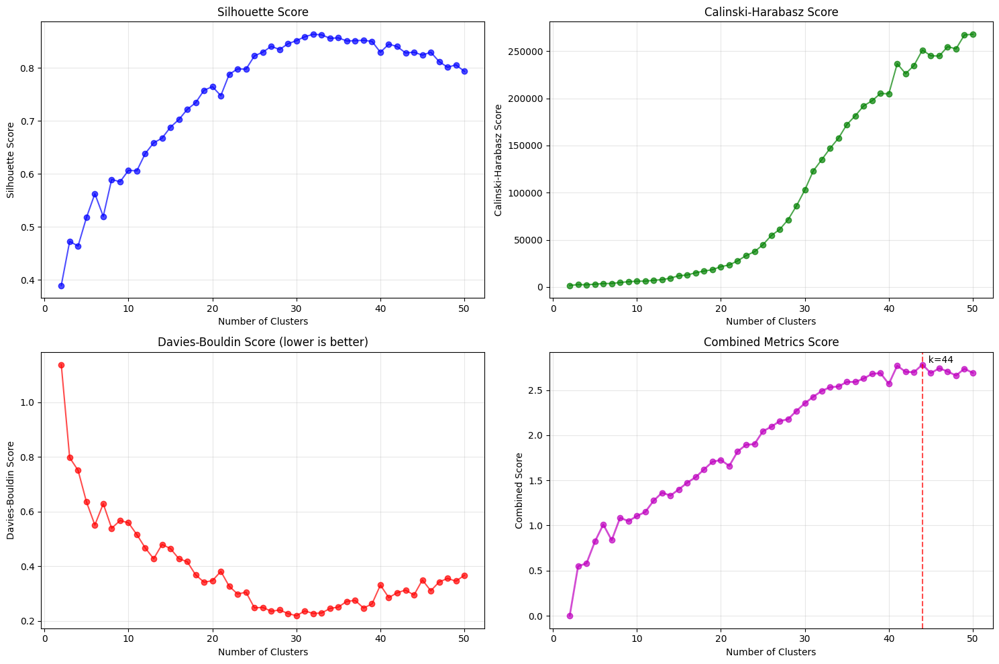

Organizing images: 100%|██████████| 2840/2840 [00:09<00:00, 290.50it/s]


✅ Clustering completed: 44 clusters

📍 STEP 3: Visualization & Analysis
   • Creating t-SNE visualization...
Sampling 2000 points for visualization...
Running t-SNE (this may take a moment)...
Running UMAP (this may take a moment)...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


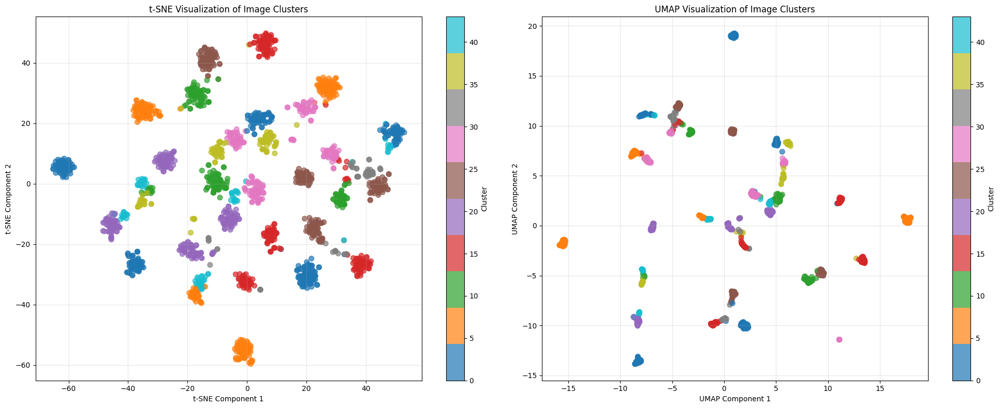

   • Creating cluster distribution chart...


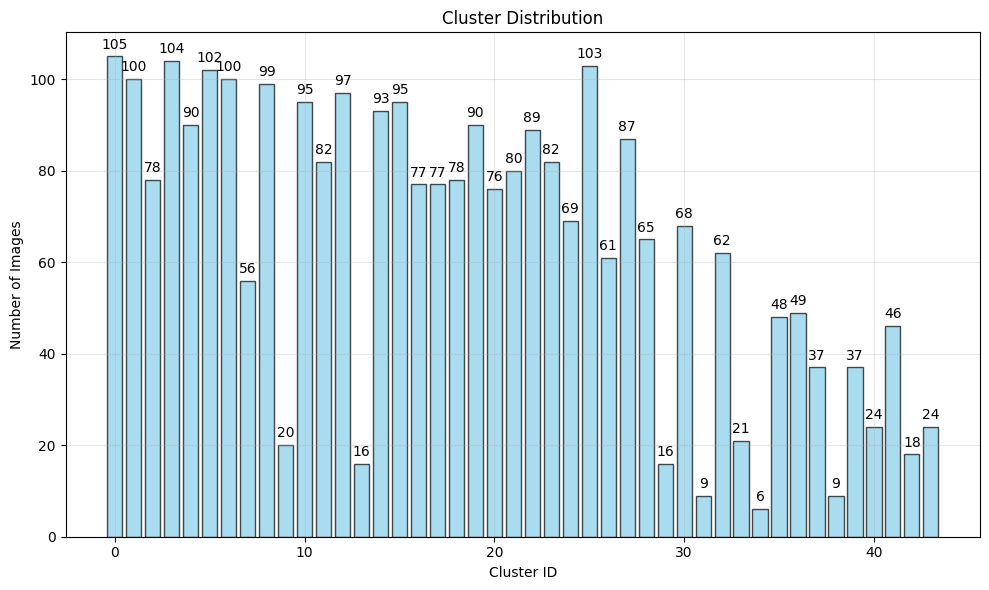

   • Displaying multiple samples per cluster...
🔍 Displaying 3 samples per cluster...
⚠️  Too many clusters (44), displaying first 36 clusters
📊 Displaying 3 samples for 36 clusters...


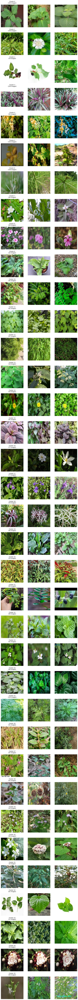

✅ Cluster samples saved to: /kaggle/working/herb_clustering_20251109_013636/analysis/cluster_samples.png

📍 STEP 4: Checkpointing

🎉 FULL DATASET CLUSTERING COMPLETED!
📊 FINAL RESULTS (Model: vit_base_r50_s16_224_in21k):
  • Total images: 2840
  • Number of clusters: 44
  • Silhouette Score: 0.8294
  • Time taken: 49.11 minutes
  • Output directory: /kaggle/working/herb_clustering_20251109_013636
  • UMAP reduction: ENABLED
  • UMAP best params: {'n_components': 2, 'n_neighbors': 100, 'min_dist': 0.0}

📁 Cluster distribution:
  • Cluster 000:  105 images (3.7%)
  • Cluster 001:  100 images (3.5%)
  • Cluster 002:   78 images (2.7%)
  • Cluster 003:  104 images (3.7%)
  • Cluster 004:   90 images (3.2%)
  • Cluster 005:  102 images (3.6%)
  • Cluster 006:  100 images (3.5%)
  • Cluster 007:   56 images (2.0%)
  • Cluster 008:   99 images (3.5%)
  • Cluster 009:   20 images (0.7%)
  • Cluster 010:   95 images (3.3%)
  • Cluster 011:   82 images (2.9%)
  • Cluster 012:   97 images (3.4%)


In [ ]:
# -*- coding: utf-8 -*-
"""Clustering_with_hybird_model.ipynb

Automatically generated by Colab.

Original file is located at
    https://colab.research.google.com/drive/1N05U6dnvxzojoIPWTSWWW1UAO79SlC4_
"""





# #  Herb Image Clustering - Sử dụng timm (vit_base_patch16_224)
#
# **Mục tiêu**: Clustering ảnh cây thuốc nam sử dụng timm.
# **Mô hình trích xuất đặc trưng**: timm.create_model('vit_base_patch16_224')
#

# #  CHẠY FULL DATASET - CÙNG NOTEBOOK

# ##  Import và Kiểm tra
N_CLUSTERS = None  # None để tự động detect
# %%
import os
import torch
import torch.nn as nn
import torchvision.models as models # Vẫn giữ để so sánh (nếu cần)
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import numpy as np
import pandas as pd
import shutil
from tqdm import tqdm
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import json
import time
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import joblib
import random

# MODIFIED: Thêm thư viện 'timm'
import timm
from timm.data import create_transform, resolve_data_config

print(" All libraries imported successfully (including timm)!")

# Kiểm tra device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f" Device: {device}")

# ##  Định nghĩa TẤT CẢ Classes trong cùng Notebook

# %%
class HerbDataset(Dataset):
    def __init__(self, root_dir, transform=None, image_size=224):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        self.image_size = image_size

        for root, dirs, files in os.walk(root_dir):
            for file in files:
                if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                    self.image_paths.append(os.path.join(root, file))

        print(f" Found {len(self.image_paths)} images in {root_dir}")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        try:
            image = Image.open(img_path).convert('RGB')
            if self.transform:
                image = self.transform(image)
            return image, img_path
        except Exception as e:
            print(f" Error loading image {img_path}: {e}")
            return torch.zeros(3, self.image_size, self.image_size), img_path

class FeatureExtractor:
    def __init__(self, device='cpu'):
        self.device = device
        self.model_name = 'vit_base_r50_s16_224_in21k' # MODIFIED: Tên model cho timm

        self.model = self._load_model()

        # MODIFIED: Lấy cấu hình và transform từ timm
        self.data_config = resolve_data_config({}, model=self.model)
        self.transform = create_transform(**self.data_config)

        # MODIFIED: Lấy kích thước ảnh từ data_config
        self.image_size = self.data_config['input_size'][1] # (C, H, W) -> H

        print(f" timm model '{self.model_name}' loaded.")
        print(f" Input size: {self.image_size}x{self.image_size}")


    def _load_model(self):
        # MODIFIED: Tải mô hình bằng timm.create_model
        # num_classes=0 sẽ tự động loại bỏ lớp classifier
        # và trả về đặc trưng [CLS] token (768 chiều)
        model = timm.create_model(
            self.model_name,
            pretrained=True,
            num_classes=0  # Quan trọng: loại bỏ head, trả về features
        )

        model = model.to(self.device)
        model.eval()
        return model

    def _get_transform(self):
        # MODIFIED: Hàm này không còn cần thiết vì transform được tạo trong __init__
        # Nhưng chúng ta sẽ giữ nó để trả về transform đã được tạo
        return self.transform

    def extract_from_directory(self, data_dir, batch_size=128):
        # MODIFIED: Truyền image_size đã được cập nhật từ data_config
        dataset = HerbDataset(data_dir, transform=self.transform, image_size=self.image_size)
        dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=2)

        features = []
        paths = []

        with torch.no_grad():
            # MODIFIED: Cập nhật mô tả của tqdm
            for batch_images, batch_paths in tqdm(dataloader, desc=f"Extracting features ({self.model_name})"):
                batch_images = batch_images.to(self.device)
                batch_features = self.model(batch_images)

                # Đặc trưng bây giờ sẽ là (batch_size, 768)
                features.extend(batch_features.cpu().numpy())
                paths.extend(batch_paths)

        return np.array(features), paths

# NEW: Thêm class UMAPReducer để tự động tìm tham số UMAP tốt nhất
class UMAPReducer:
    def __init__(self, random_state=42):
        self.random_state = random_state
        self.best_params_ = None
        self.best_embedding_ = None

    def _evaluate_umap_params(self, features, n_components, n_neighbors, min_dist):
        """Đánh giá chất lượng embedding UMAP bằng silhouette score"""
        try:
            import umap
            reducer = umap.UMAP(
                n_components=n_components,
                n_neighbors=n_neighbors,
                min_dist=min_dist,
                random_state=self.random_state
            )
            embedding = reducer.fit_transform(features)

            # Sử dụng silhouette score để đánh giá
            if len(embedding) > 1:
                # Thử clustering với số cụm nhỏ để đánh giá
                n_clusters = min(5, len(embedding) - 1)
                if n_clusters > 1:
                    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=5)
                    clusters = kmeans.fit_predict(embedding)
                    if len(np.unique(clusters)) > 1:
                        score = silhouette_score(embedding, clusters)
                        return embedding, score
            return embedding, -1
        except Exception as e:
            print(f" UMAP failed with params n_components={n_components}, n_neighbors={n_neighbors}, min_dist={min_dist}: {e}")
            return None, -1

    def fit_transform(self, features, max_components=50, sample_size=5000):
        """Tự động tìm tham số UMAP tốt nhất và transform features"""
        import umap

        print(" Tuning UMAP parameters automatically...")

        # Lấy mẫu nếu dataset quá lớn
        if len(features) > sample_size:
            print(f" Sampling {sample_size} instances for UMAP parameter tuning...")
            indices = np.random.choice(len(features), sample_size, replace=False)
            features_sample = features[indices]
        else:
            features_sample = features

        # Xác định phạm vi tham số dựa trên kích thước dữ liệu
        n_samples = len(features_sample)

        # Tự động xác định n_components dựa trên kích thước dữ liệu
        if n_samples < 100:
            n_components_options = [min(5, n_samples - 1)]
            n_neighbors_options = [min(5, n_samples - 1)]
        elif n_samples < 1000:
            n_components_options = [2, 5, 10, 15]
            n_neighbors_options = [5, 15, 30, 50]
        else:
            n_components_options = [2, 5, 10, 15, 20, 25]
            n_neighbors_options = [5, 15, 30, 50, 100]

        n_components_options = [nc for nc in n_components_options if nc < n_samples and nc < max_components]
        n_neighbors_options = [nn for nn in n_neighbors_options if nn < n_samples]

        min_dist_options = [0.0, 0.1, 0.25, 0.5, 0.8, 0.99]

        best_score = -1
        best_params = {}
        best_embedding = None

        total_combinations = len(n_components_options) * len(n_neighbors_options) * len(min_dist_options)
        print(f" Testing {total_combinations} UMAP parameter combinations...")

        pbar = tqdm(total=total_combinations, desc="UMAP parameter tuning")

        for n_components in n_components_options:
            for n_neighbors in n_neighbors_options:
                for min_dist in min_dist_options:
                    embedding, score = self._evaluate_umap_params(
                        features_sample, n_components, n_neighbors, min_dist
                    )

                    if score > best_score and embedding is not None:
                        best_score = score
                        best_params = {
                            'n_components': n_components,
                            'n_neighbors': n_neighbors,
                            'min_dist': min_dist
                        }
                        best_embedding = embedding

                    pbar.update(1)

        pbar.close()

        if best_score == -1:
            print(" No valid UMAP parameters found, using defaults")
            best_params = {'n_components': 2, 'n_neighbors': 15, 'min_dist': 0.1}
            reducer = umap.UMAP(**best_params, random_state=self.random_state)
            best_embedding = reducer.fit_transform(features_sample)
        else:
            print(f" Best UMAP parameters: {best_params} (silhouette: {best_score:.4f})")

        self.best_params_ = best_params

        # Áp dụng tham số tốt nhất cho toàn bộ dataset
        print(" Applying best UMAP parameters to full dataset...")
        reducer = umap.UMAP(**best_params, random_state=self.random_state)
        self.best_embedding_ = reducer.fit_transform(features)

        return self.best_embedding_

class ClusterManager:
    def __init__(self, output_dir, use_umap=True):
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)
        self.scaler = StandardScaler()
        self.use_umap = use_umap
        self.umap_reducer = UMAPReducer() if use_umap else None

    def perform_clustering(self, features, image_paths, n_clusters=None):
        # Bước mới: Giảm chiều với UMAP nếu được kích hoạt
        if self.use_umap:
            print(" Reducing dimensions with UMAP...")
            features = self.umap_reducer.fit_transform(features)
            # Lưu embedding của UMAP
            np.save(os.path.join(self.output_dir, "umap_embedding.npy"), features)
            # Lưu tham số UMAP tốt nhất
            with open(os.path.join(self.output_dir, "umap_best_params.json"), 'w') as f:
                json.dump(self.umap_reducer.best_params_, f, indent=2)

        features_scaled = self.scaler.fit_transform(features)

        if n_clusters is None:
            n_clusters = self._auto_detect_clusters(features_scaled)

        n_clusters = min(n_clusters, len(features) // 2)

        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
        clusters = kmeans.fit_predict(features_scaled)

        metrics = self._calculate_metrics(features_scaled, clusters)

        joblib.dump(kmeans, os.path.join(self.output_dir, "kmeans_model.pkl"))
        joblib.dump(self.scaler, os.path.join(self.output_dir, "scaler.pkl"))

        self._organize_images(image_paths, clusters)
        self._save_results(image_paths, clusters, metrics)

        return clusters, metrics

    def _auto_detect_clusters(self, features_scaled, max_clusters=50):
        from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score

        n_samples = len(features_scaled)
        max_clusters = min(max_clusters, n_samples // 3)

        if max_clusters < 2:
            return 2

        if n_samples > 1000:
             k_range = np.linspace(2, max_clusters, num=min(50, max_clusters-1), dtype=int)
             print(f"Large dataset, sampling {len(k_range)} k-values from 2 to {max_clusters}...")
        else:
             k_range = range(2, max_clusters + 1)

        scores = []

        print(" Analyzing optimal clusters with multiple metrics...")

        for k in tqdm(k_range, desc="Testing clusters"):
            if k >= n_samples:
                continue

            kmeans = KMeans(n_clusters=k, random_state=42, n_init=5)
            clusters = kmeans.fit_predict(features_scaled)

            if len(np.unique(clusters)) < 2:
                scores.append({'k': k, 'silhouette': -1, 'calinski': -1, 'davies_bouldin': float('inf')})
                continue

            silhouette = silhouette_score(features_scaled, clusters)
            calinski = calinski_harabasz_score(features_scaled, clusters)
            davies_bouldin = davies_bouldin_score(features_scaled, clusters)

            scores.append({
                'k': k,
                'silhouette': silhouette,
                'calinski': calinski,
                'davies_bouldin': davies_bouldin
            })

        scores_df = pd.DataFrame(scores)

        scores_df['silhouette_norm'] = (scores_df['silhouette'] - scores_df['silhouette'].min()) / (scores_df['silhouette'].max() - scores_df['silhouette'].min())
        scores_df['calinski_norm'] = (scores_df['calinski'] - scores_df['calinski'].min()) / (scores_df['calinski'].max() - scores_df['calinski'].min())
        scores_df['davies_bouldin_norm'] = 1 - ((scores_df['davies_bouldin'] - scores_df['davies_bouldin'].min()) / (scores_df['davies_bouldin'].max() - scores_df['davies_bouldin'].min()))

        scores_df['combined_score'] = (
            scores_df['silhouette_norm'] +
            scores_df['calinski_norm'] +
            scores_df['davies_bouldin_norm']
        )

        best_row = scores_df.loc[scores_df['combined_score'].idxmax()]
        best_k = int(best_row['k'])
        best_score = best_row['combined_score']

        print(f" Optimal clusters: {best_k} (combined score: {best_score:.4f})")
        print(f"   • Silhouette: {best_row['silhouette']:.4f}")
        print(f"   • Calinski-Harabasz: {best_row['calinski']:.4f}")
        print(f"   • Davies-Bouldin: {best_row['davies_bouldin']:.4f}")

        self._plot_metrics_comparison(scores_df)

        return best_k

    def _plot_metrics_comparison(self, scores_df):
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

        ax1.plot(scores_df['k'], scores_df['silhouette'], 'bo-', alpha=0.7)
        ax1.set_xlabel('Number of Clusters')
        ax1.set_ylabel('Silhouette Score')
        ax1.set_title('Silhouette Score')
        ax1.grid(True, alpha=0.3)

        ax2.plot(scores_df['k'], scores_df['calinski'], 'go-', alpha=0.7)
        ax2.set_xlabel('Number of Clusters')
        ax2.set_ylabel('Calinski-Harabasz Score')
        ax2.set_title('Calinski-Harabasz Score')
        ax2.grid(True, alpha=0.3)

        ax3.plot(scores_df['k'], scores_df['davies_bouldin'], 'ro-', alpha=0.7)
        ax3.set_xlabel('Number of Clusters')
        ax3.set_ylabel('Davies-Bouldin Score')
        ax3.set_title('Davies-Bouldin Score (lower is better)')
        ax3.grid(True, alpha=0.3)

        ax4.plot(scores_df['k'], scores_df['combined_score'], 'mo-', alpha=0.7, linewidth=2)
        ax4.set_xlabel('Number of Clusters')
        ax4.set_ylabel('Combined Score')
        ax4.set_title('Combined Metrics Score')
        ax4.grid(True, alpha=0.3)

        best_k = scores_df.loc[scores_df['combined_score'].idxmax(), 'k']
        best_score = scores_df.loc[scores_df['combined_score'].idxmax(), 'combined_score']
        ax4.axvline(x=best_k, color='red', linestyle='--', alpha=0.7)
        ax4.text(best_k, best_score, f'  k={best_k}', verticalalignment='bottom')

        plt.tight_layout()
        plt.show()

    def _calculate_metrics(self, features, clusters):
        metrics = {
            'n_clusters': len(np.unique(clusters)),
            'n_samples': len(features),
            'cluster_distribution': {}
        }

        unique, counts = np.unique(clusters, return_counts=True)
        for cluster_id, count in zip(unique, counts):
            metrics['cluster_distribution'][int(cluster_id)] = int(count)

        if len(unique) > 1:
            metrics['silhouette_score'] = float(silhouette_score(features, clusters))
        else:
            metrics['silhouette_score'] = -1.0

        return metrics

    def _organize_images(self, image_paths, clusters):
        for img_path, cluster_id in tqdm(zip(image_paths, clusters), total=len(image_paths), desc="Organizing images"):
            cluster_dir = os.path.join(self.output_dir, f"cluster_{cluster_id:03d}")
            os.makedirs(cluster_dir, exist_ok=True)

            file_name = os.path.basename(img_path)
            dest_path = os.path.join(cluster_dir, file_name)
            shutil.copy2(img_path, dest_path)

    def _save_results(self, image_paths, clusters, metrics):
        results_df = pd.DataFrame({
            'image_path': image_paths,
            'cluster': clusters
        })
        results_df.to_csv(os.path.join(self.output_dir, "clustering_results.csv"), index=False)

        with open(os.path.join(self.output_dir, "clustering_metrics.json"), 'w') as f:
            json.dump(metrics, f, indent=2)

class ResultAnalyzer:
    def __init__(self, output_dir):
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

    def visualize_clusters(self, features, clusters, image_paths=None, sample_size=2000):
        if len(features) > sample_size:
            print(f"Sampling {sample_size} points for visualization...")
            indices = np.random.choice(len(features), sample_size, replace=False)
            features_sample = features[indices]
            clusters_sample = clusters[indices]
            if image_paths:
                paths_sample = [image_paths[i] for i in indices]
            else:
                paths_sample = None
        else:
            features_sample = features
            clusters_sample = clusters
            paths_sample = image_paths

        scaler = StandardScaler()
        features_scaled = scaler.fit_transform(features_sample)

        # Create a figure with two subplots
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

        # t-SNE visualization
        print("Running t-SNE (this may take a moment)...")
        tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(features_sample)-1))
        features_tsne = tsne.fit_transform(features_scaled)

        scatter1 = ax1.scatter(features_tsne[:, 0], features_tsne[:, 1],
                              c=clusters_sample, cmap='tab10', alpha=0.7, s=50)
        ax1.set_title('t-SNE Visualization of Image Clusters')
        ax1.set_xlabel('t-SNE Component 1')
        ax1.set_ylabel('t-SNE Component 2')
        ax1.grid(True, alpha=0.3)
        plt.colorbar(scatter1, ax=ax1, label='Cluster')

        # UMAP visualization
        print("Running UMAP (this may take a moment)...")
        try:
            import umap
            reducer = umap.UMAP(random_state=42)
            features_umap = reducer.fit_transform(features_scaled)

            scatter2 = ax2.scatter(features_umap[:, 0], features_umap[:, 1],
                                  c=clusters_sample, cmap='tab10', alpha=0.7, s=50)
            ax2.set_title('UMAP Visualization of Image Clusters')
            ax2.set_xlabel('UMAP Component 1')
            ax2.set_ylabel('UMAP Component 2')
            ax2.grid(True, alpha=0.3)
            plt.colorbar(scatter2, ax=ax2, label='Cluster')

        except ImportError:
            ax2.text(0.5, 0.5, 'UMAP not installed.\nRun: pip install umap-learn',
                    ha='center', va='center', transform=ax2.transAxes, fontsize=12)
            ax2.set_title('UMAP Visualization (Not Available)')
            ax2.set_xticks([])
            ax2.set_yticks([])

        plt.tight_layout()
        plt.savefig(os.path.join(self.output_dir, "cluster_visualizations.png"), dpi=300, bbox_inches='tight')
        plt.show()

        # Return the projections for potential further use
        return features_tsne, features_umap if 'umap' in locals() else None

    def plot_cluster_distribution(self, metrics):
        plt.figure(figsize=(10, 6))

        clusters = list(metrics['cluster_distribution'].keys())
        counts = list(metrics['cluster_distribution'].values())

        plt.bar(clusters, counts, color='skyblue', edgecolor='black', alpha=0.7)
        plt.xlabel('Cluster ID')
        plt.ylabel('Number of Images')
        plt.title('Cluster Distribution')
        plt.grid(True, alpha=0.3)

        for i, count in enumerate(counts):
            plt.text(clusters[i], count + max(counts)*0.01, str(count), ha='center', va='bottom')

        plt.tight_layout()
        plt.savefig(os.path.join(self.output_dir, "cluster_distribution.png"), dpi=300, bbox_inches='tight')
        plt.show()

    def display_cluster_representatives(self, image_paths, clusters, metrics, max_display=36):
        print(" Displaying cluster representatives...")

        unique_clusters = np.unique(clusters)

        if len(unique_clusters) > max_display:
            print(f"  Too many clusters ({len(unique_clusters)}), displaying first {max_display} clusters")
            unique_clusters = unique_clusters[:max_display]

        cluster_representatives = {}
        for cluster_id in unique_clusters:
            cluster_indices = np.where(clusters == cluster_id)[0]
            if len(cluster_indices) > 0:
                cluster_representatives[cluster_id] = image_paths[cluster_indices[0]]

        n_clusters = len(cluster_representatives)
        n_cols = min(4, n_clusters)
        n_rows = (n_clusters + n_cols - 1) // n_cols

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows))

        if n_clusters == 1:
            axes = np.array([axes])

        if n_rows > 1 and n_cols > 1:
            axes = axes.flat

        print(f" Displaying {n_clusters} cluster representatives...")

        for idx, (cluster_id, img_path) in enumerate(cluster_representatives.items()):
            try:
                img = Image.open(img_path)

                if n_rows == 1:
                    ax = axes[idx] if n_cols > 1 else axes
                else:
                    ax = axes[idx] if isinstance(axes, np.ndarray) else axes

                ax.imshow(img)
                cluster_count = metrics['cluster_distribution'].get(cluster_id, 0)
                percentage = (cluster_count / metrics['n_samples']) * 100
                ax.set_title(f'Cluster {cluster_id}\n{cluster_count} images ({percentage:.1f}%)',
                           fontsize=10, pad=10)
                ax.axis('off')

            except Exception as e:
                print(f" Error displaying image for cluster {cluster_id}: {e}")
                if n_rows == 1:
                    axes[idx].axis('off')
                else:
                    axes[idx].axis('off')

        if isinstance(axes, np.ndarray):
            for idx in range(len(cluster_representatives), len(axes)):
                if n_rows == 1:
                    axes[idx].axis('off')
                else:
                    axes[idx].axis('off')

        plt.tight_layout()
        representatives_path = os.path.join(self.output_dir, "cluster_representatives.png")
        plt.savefig(representatives_path, dpi=300, bbox_inches='tight')
        plt.show()

        print(f" Cluster representatives saved to: {representatives_path}")

    def display_multiple_samples_per_cluster(self, image_paths, clusters, metrics, samples_per_cluster=3, max_clusters=36):
        print(f" Displaying {samples_per_cluster} samples per cluster...")

        unique_clusters = np.unique(clusters)

        if len(unique_clusters) > max_clusters:
            print(f"  Too many clusters ({len(unique_clusters)}), displaying first {max_clusters} clusters")
            unique_clusters = unique_clusters[:max_clusters]

        cluster_samples = {}
        for cluster_id in unique_clusters:
            cluster_indices = np.where(clusters == cluster_id)[0]
            if len(cluster_indices) > samples_per_cluster:
                sample_indices = np.random.choice(cluster_indices, samples_per_cluster, replace=False)
            else:
                sample_indices = cluster_indices

            cluster_samples[cluster_id] = [image_paths[i] for i in sample_indices]

        n_clusters = len(cluster_samples)
        n_cols = samples_per_cluster
        n_rows = n_clusters

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(3*n_cols, 3*n_rows))

        if n_rows == 1:
            axes = np.array([axes])
        if n_cols == 1:
             axes = axes.reshape(-1, 1)

        print(f" Displaying {samples_per_cluster} samples for {n_clusters} clusters...")

        for row, (cluster_id, sample_paths) in enumerate(cluster_samples.items()):
            for col, img_path in enumerate(sample_paths):
                try:
                    img = Image.open(img_path)

                    if n_rows == 1:
                        ax = axes[0, col] if n_cols > 1 else axes[0,0]
                    else:
                        ax = axes[row, col] if n_cols > 1 else axes[row, 0]

                    ax.imshow(img)

                    if col == 0:
                        cluster_count = metrics['cluster_distribution'].get(cluster_id, 0)
                        ax.set_title(f'Cluster {cluster_id}\n({cluster_count} images)',
                                   fontsize=10, pad=10)

                    ax.axis('off')

                except Exception as e:
                    print(f"❌ Error displaying image for cluster {cluster_id}: {e}")
                    if n_rows == 1:
                        axes[0, col].axis('off')
                    else:
                        axes[row, col].axis('off')

            for col in range(len(sample_paths), n_cols):
                if n_rows == 1:
                    axes[0, col].axis('off')
                else:
                    axes[row, col].axis('off')

        plt.tight_layout()
        samples_path = os.path.join(self.output_dir, "cluster_samples.png")
        plt.savefig(samples_path, dpi=300, bbox_inches='tight')
        plt.show()

        print(f" Cluster samples saved to: {samples_path}")

print(" Updated ResultAnalyzer with cluster representatives display!")

class CheckpointManager:
    def __init__(self, checkpoint_dir):
        self.checkpoint_dir = checkpoint_dir
        os.makedirs(checkpoint_dir, exist_ok=True)

    def save_session(self, features, image_paths, clusters, metrics, session_info):
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        session_dir = os.path.join(self.checkpoint_dir, f"session_{timestamp}")
        os.makedirs(session_dir, exist_ok=True)

        np.save(os.path.join(session_dir, "features.npy"), features)
        np.save(os.path.join(session_dir, "image_paths.npy"), np.array(image_paths))
        np.save(os.path.join(session_dir, "clusters.npy"), clusters)

        with open(os.path.join(session_dir, "metrics.json"), 'w') as f:
            json.dump(metrics, f, indent=2)

        session_info['timestamp'] = timestamp
        session_info['session_dir'] = session_dir
        with open(os.path.join(session_dir, "session_info.json"), 'w') as f:
            json.dump(session_info, f, indent=2)

        return session_dir

class HerbClusteringPipeline:
    def __init__(self, data_path, output_base_dir="/kaggle/working/", use_umap=True):
        self.data_path = data_path
        self.output_base_dir = output_base_dir
        self.session_id = datetime.now().strftime("%Y%m%d_%H%M%S")
        self.use_umap = use_umap

        self.session_dir = os.path.join(output_base_dir, f"herb_clustering_{self.session_id}")
        os.makedirs(self.session_dir, exist_ok=True)

        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

        # MODIFIED: Khởi tạo FeatureExtractor (sử dụng timm)
        print(f"Initializing FeatureExtractor (timm) with {self.device}...")
        self.feature_extractor = FeatureExtractor(self.device)

        self.cluster_manager = ClusterManager(os.path.join(self.session_dir, "clustering"), use_umap=use_umap)
        self.checkpoint_manager = CheckpointManager(os.path.join(self.session_dir, "checkpoints"))
        self.analyzer = ResultAnalyzer(os.path.join(self.session_dir, "analysis"))

        print(f" Pipeline initialized for: {data_path}")
        print(f" Output directory: {self.session_dir}")
        print(f" UMAP dimensionality reduction: {'ENABLED' if use_umap else 'DISABLED'}")

    def run(self, n_clusters=None, batch_size=128, force_extract=False):
        start_time = time.time()
        session_info = {
            'session_id': self.session_id,
            'data_path': self.data_path,
            'n_clusters': n_clusters,
            'batch_size': batch_size,
            'device': str(self.device),
            'start_time': datetime.now().isoformat(),
            # MODIFIED: Ghi lại model 'timm' đã dùng
            'model': self.feature_extractor.model_name,
            'use_umap': self.use_umap
        }

        print("\n" + "="*60)
        print(f" STARTING FULL DATASET CLUSTERING (with {session_info['model']})")
        print(f" UMAP dimensionality reduction: {'ENABLED' if self.use_umap else 'DISABLED'}")
        print("="*60)

        try:
            # Bước 1: Feature Extraction
            print(f"\n STEP 1: Feature Extraction ({session_info['model']})")
            features, image_paths = self.feature_extractor.extract_from_directory(
                self.data_path, batch_size=batch_size
            )

            session_info['n_images'] = len(image_paths)
            session_info['feature_shape'] = features.shape
            session_info['original_feature_dim'] = features.shape[1]

            print(f" Features extracted: {features.shape}") # Sẽ là (N, 768)

            # Bước 2: Clustering
            print("\n STEP 2: Clustering")
            clusters, metrics = self.cluster_manager.perform_clustering(
                features, image_paths, n_clusters=n_clusters
            )

            session_info['final_n_clusters'] = metrics['n_clusters']
            session_info['silhouette_score'] = metrics['silhouette_score']

            # Thêm thông tin UMAP nếu được sử dụng
            if self.use_umap and hasattr(self.cluster_manager.umap_reducer, 'best_params_'):
                session_info['umap_best_params'] = self.cluster_manager.umap_reducer.best_params_
                session_info['reduced_feature_dim'] = clusters.shape[0]  # Số chiều sau khi giảm

            print(f" Clustering completed: {metrics['n_clusters']} clusters")

            # Bước 3: Visualization
            print("\n STEP 3: Visualization & Analysis")
            print("   • Creating t-SNE visualization...")
            self.analyzer.visualize_clusters(features, clusters, image_paths)

            print("   • Creating cluster distribution chart...")
            self.analyzer.plot_cluster_distribution(metrics)

            print("   • Displaying multiple samples per cluster...")
            self.analyzer.display_multiple_samples_per_cluster(image_paths, clusters, metrics)

            # Bước 4: Checkpointing
            print("\n📍 STEP 4: Checkpointing")
            checkpoint_dir = self.checkpoint_manager.save_session(
                features, image_paths, clusters, metrics, session_info
            )

            end_time = time.time()
            duration = end_time - start_time
            session_info['duration_seconds'] = duration
            session_info['duration_minutes'] = duration / 60
            session_info['end_time'] = datetime.now().isoformat()
            session_info['status'] = 'COMPLETED'

            with open(os.path.join(self.session_dir, "session_info.json"), 'w') as f:
                json.dump(session_info, f, indent=2)

            print("\n" + "="*60)
            print("🎉 FULL DATASET CLUSTERING COMPLETED!")
            print("="*60)
            self._print_summary(metrics, duration)

            return {
                'features': features,
                'image_paths': image_paths,
                'clusters': clusters,
                'metrics': metrics,
                'session_info': session_info,
                'session_dir': self.session_dir
            }

        except Exception as e:
            print(f"\n❌ PIPELINE FAILED: {e}")
            session_info['status'] = 'FAILED'
            session_info['error'] = str(e)

            with open(os.path.join(self.session_dir, "session_info.json"), 'w') as f:
                json.dump(session_info, f, indent=2)

            raise e

    def _print_summary(self, metrics, duration):
        # MODIFIED: Hiển thị tên model
        model_name = self.feature_extractor.model_name
        print(f" FINAL RESULTS (Model: {model_name}):")
        print(f"  • Total images: {metrics['n_samples']}")
        print(f"  • Number of clusters: {metrics['n_clusters']}")
        print(f"  • Silhouette Score: {metrics['silhouette_score']:.4f}")
        print(f"  • Time taken: {duration/60:.2f} minutes")
        print(f"  • Output directory: {self.session_dir}")
        print(f"  • UMAP reduction: {'ENABLED' if self.use_umap else 'DISABLED'}")

        if self.use_umap and hasattr(self.cluster_manager.umap_reducer, 'best_params_'):
            print(f"  • UMAP best params: {self.cluster_manager.umap_reducer.best_params_}")

        print(f"\n Cluster distribution:")
        for cluster_id, count in sorted(metrics['cluster_distribution'].items()):
            percentage = (count / metrics['n_samples']) * 100
            print(f"  • Cluster {cluster_id:03d}: {count:4d} images ({percentage:.1f}%)")

print(" Updated HerbClusteringPipeline with enhanced visualization!")


print(" All classes defined successfully!")

# ##  TEST NHANH với Dữ liệu Mẫu (Optional)

# %%
def quick_test():
    """Test nhanh với 20 ảnh mẫu"""
    print(" Running Quick Test with Sample Data (timm ViT-Base)...")

    test_dir = "/kaggle/working/test_sample_timm_vit"
    os.makedirs(test_dir, exist_ok=True)

    for i in range(20):
        test_image = np.random.randint(0, 255, (224, 224, 3), dtype=np.uint8)
        img = Image.fromarray(test_image)
        img.save(os.path.join(test_dir, f"test_{i:03d}.jpg"))

    pipeline = HerbClusteringPipeline(test_dir, "/kaggle/working/test_results_timm_vit", use_umap=True)
    results = pipeline.run(n_clusters=3, batch_size=8)

    shutil.rmtree(test_dir)

    return results

# UNCOMMENT để chạy test nhanh
# test_results = quick_test()
# print(" Quick test completed!")

# ##  CHẠY FULL DATASET VỚI TÍNH NĂNG MỚI

# %%
# CONFIGURATION
DATA_PATH = "/content/drive/MyDrive/KHMT_3_MEMBERS/12526/12526_CT31201_KhaiKhoangDuLieu/Project/Data"
# DATA_PATH = "/kaggle/input/dataofleaf/Data"

OUTPUT_PATH =  "/content/drive/MyDrive/KHMT_3_MEMBERS/12526/12526_CT31201_KhaiKhoangDuLieu/Project/OUTPUT"
# Đường dẫn dataset của bạn
USE_UMAP = True  # Bật/tắt UMAP dimensionality reduction

BATCH_SIZE = 128    # Điều chỉnh theo bộ nhớ (ViT có thể cần nhiều VRAM)

print(" STARTING FULL DATASET CLUSTERING WITH timm ViT-Base")
print(f" Data path: {DATA_PATH}")
print(f" Clusters: {'Auto-detect' if N_CLUSTERS is None else N_CLUSTERS}")
print(f" Batch size: {BATCH_SIZE}")
print(f" UMAP dimensionality reduction: {'ENABLED' if USE_UMAP else 'DISABLED'}")
print("-" * 50)

if not os.path.exists(DATA_PATH):
  print(f" ERROR: Data path not found: {DATA_PATH}")
  print("Please check the DATA_PATH variable")
else:
  image_count = 0
  for root, dirs, files in os.walk(DATA_PATH):
      for file in files:
          if file.lower().endswith(('.png', '.jpg', '.jpeg')):
              image_count += 1

  print(f" Dataset contains: {image_count} images")

  print("\n Initializing pipeline...")
  pipeline = HerbClusteringPipeline(DATA_PATH,OUTPUT_PATH ,use_umap=USE_UMAP)

  print(" Starting clustering process...")
  full_results = pipeline.run(
      n_clusters=N_CLUSTERS,
      batch_size=BATCH_SIZE,
      force_extract=False
  )

  print("\n FULL DATASET CLUSTERING COMPLETED SUCCESSFULLY!")
  print(" You can find all results in:", full_results['session_dir'])